In [1]:
import os
import sys
import random
import math
import numpy as np
from skimage import io
import matplotlib
import matplotlib.pyplot as plt
import balloon

#import coco
import utils
import model as modellib
import visualize
from config import Config
 
# Root directory of the project
ROOT_DIR = os.getcwd()
 
# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")
print(MODEL_DIR)

# Local path to trained weights file
# 最後一個訓練權重所在位置 C:\Users\Amber\Desktop\Mask_RCNN_balloon\logs\balloon20210408T0958\mask_rcnn_balloon_0030.h5
MY_MODEL_PATH = os.path.join(ROOT_DIR, " ") 
print(MY_MODEL_PATH)

# Local path to trained weights file
#MODEL_WEIGHT_PATH = os.path.join(ROOT_DIR, " ")  
#print(MODEL_WEIGHT_PATH)

# Download COCO trained weights from Releases if needed
if not os.path.exists(MY_MODEL_PATH):
    utils.download_trained_weights(MY_MODEL_PATH)
 
# Directory of images to run detection on
IMAGE_DIR = os.path.join(ROOT_DIR, "val")   #輸入預測圖片路徑
print(IMAGE_DIR)

Instructions for updating:
non-resource variables are not supported in the long term


Using TensorFlow backend.


C:\Users\Amber\Desktop\Mask_RCNN_balloon\logs
C:\Users\Amber\Desktop\Mask_RCNN_balloon\ 
C:\Users\Amber\Desktop\Mask_RCNN_balloon\val


In [2]:
class BalloonConfig(Config):
    """Configuration for training on MS COCO.
    Derives from the base Config class and overrides values specific
    to the COCO dataset.
    """
    # Give the configuration a recognizable name
    NAME = "balloon"
 
    # We use a GPU with 12GB memory, which can fit two images.
    # Adjust down if you use a smaller GPU.
    IMAGES_PER_GPU = 1
 
    # Uncomment to train on 8 GPUs (default is 1)
    # GPU_COUNT = 8
 
    # Number of classes (including background)

    NUM_CLASSES = 1 + 2  # COCO has 80 classes

In [3]:
config = BalloonConfig()
BALLOON_DIR = os.path.join(ROOT_DIR, "./")
print(BALLOON_DIR)

C:\Users\Amber\Desktop\Mask_RCNN_balloon\./


In [4]:
class InferenceConfig(BalloonConfig):
    # Set batch size to 1 since we'll be running inference on
    # one image at a time. Batch size = GPU_COUNT * IMAGES_PER_GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
 
config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet50
BACKBONE_SHAPES                [[256 256]
 [128 128]
 [ 64  64]
 [ 32  32]
 [ 16  16]]
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
GPU_COUNT                      1
IMAGES_PER_GPU                 1
IMAGE_MAX_DIM                  1024
IMAGE_MIN_DIM                  800
IMAGE_PADDING                  True
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INSTANCES               50
MEAN_PIXEL                     [123.7 116.8 103.9]
MINI_MASK_SHAPE                (56, 56)
NAME                           balloon
NUM_CLASSES                    3
POOL_SIZE                      7
POST_NMS_ROIS_INFERENC

In [5]:
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

In [10]:
# Create model object in inference mode.
model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR, config=config)
 
# Load weights trained on MS-COCO
MY_MODEL_PATH = model.find_last()[1]
print(MY_MODEL_PATH)

#model.load_weights(MY_MODEL_PATH, by_name=True)
model.load_weights(MY_MODEL_PATH, by_name=True, exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_bbox", "mrcnn_mask"])
#model.load_weights(MY_MODEL_PATH, by_name=True, exclude=["mrcnn_class_logits", "mrcnn_bbox_fc", "mrcnn_bbox", "mrcnn_mask", "rpn_model"])

# COCO Class names
# Index of the class in the list is its ID. For example, to get ID of
# the teddy bear class, use: class_names.index('teddy bear')
class_names = ['BG', 'balloon','person']
print(class_names)


C:\Users\Amber\Desktop\Mask_RCNN_balloon\logs\balloon20210408T0958\mask_rcnn_balloon_0030.h5
['BG', 'balloon', 'person']


['14898532020_ba6199dd22_k.jpg', '16335852991_f55de7958d_k.jpg', '24631331976_defa3bb61f_k.jpg', '2917282960_06beee649a_b.jpg', '3800636873_ace2c2795f_b.jpg', '3825919971_93fb1ec581_b.jpg', '410488422_5f8991f26e_b.jpg', '4581425993_72b9b15fc0_b.jpg', '4838031651_3e7b5ea5c7_b.jpg', '5555705118_3390d70abe_b.jpg', '5603212091_2dfe16ea72_b.jpg', '6810773040_3d81036d05_k.jpg', '8053085540_a72bd21a64_k.jpg', 'via_region_data.json']
Processing 1 images
image                    shape: (1365, 2048, 3)       min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 11)               min:    0.00000  max: 2048.00000


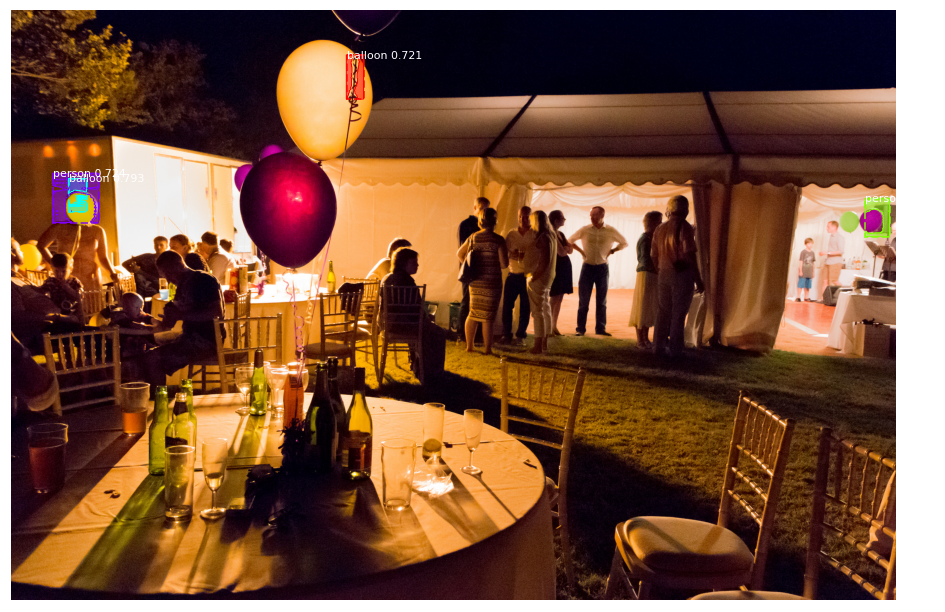

Processing 1 images
image                    shape: (2048, 1536, 3)       min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  137.20000
image_metas              shape: (1, 11)               min:    0.00000  max: 2048.00000


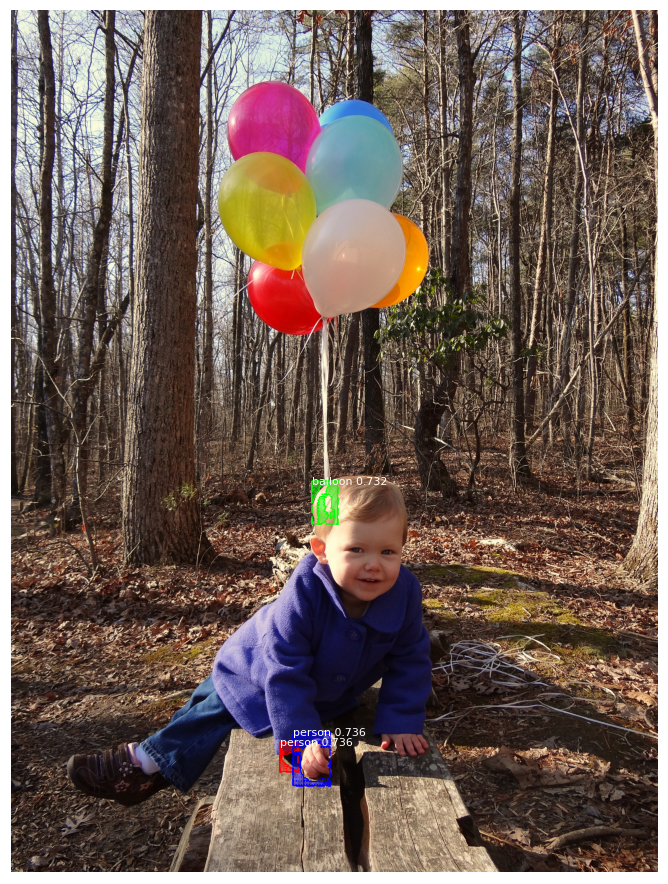

Processing 1 images
image                    shape: (2048, 1323, 3)       min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 11)               min:    0.00000  max: 2048.00000

*** No instances to display *** 



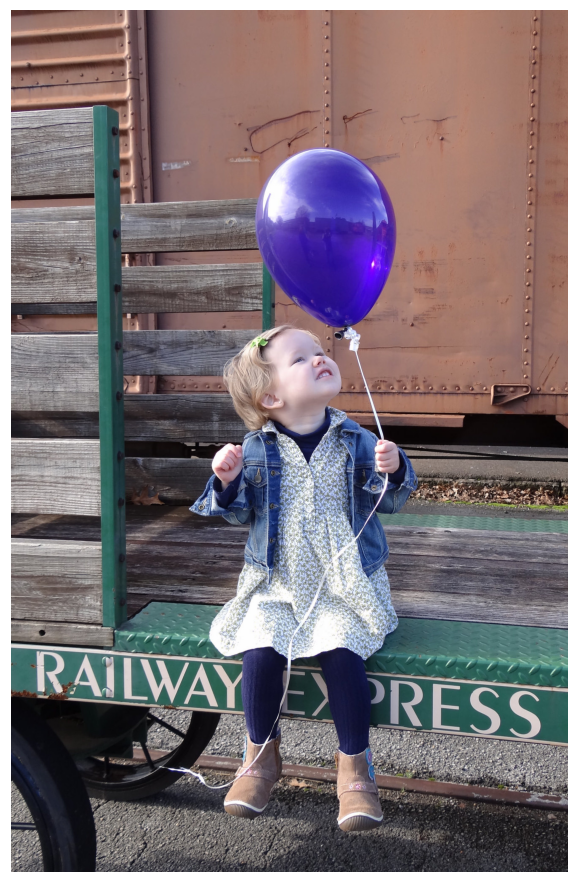

Processing 1 images
image                    shape: (681, 1024, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 11)               min:    0.00000  max: 1024.00000

*** No instances to display *** 



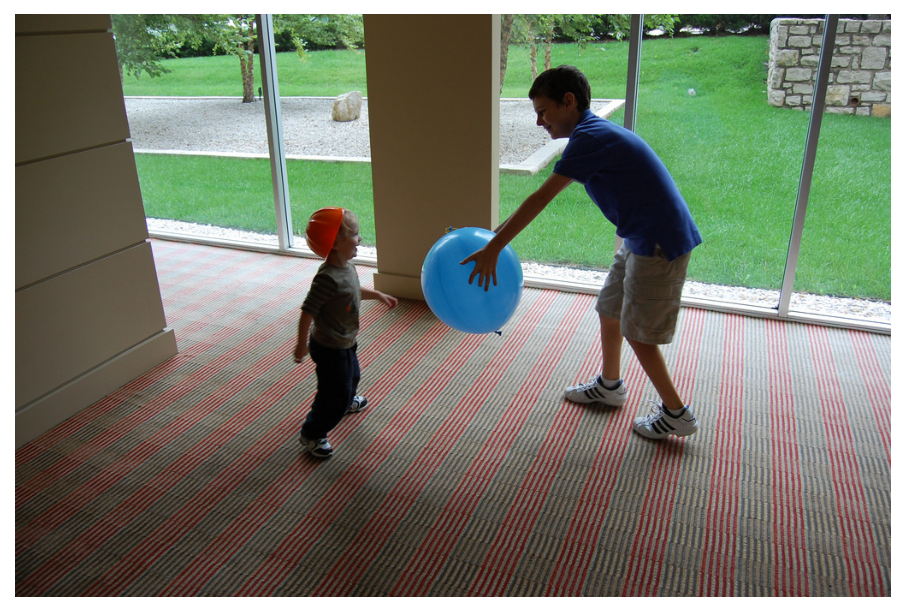

Processing 1 images
image                    shape: (1024, 686, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  138.20000
image_metas              shape: (1, 11)               min:    0.00000  max: 1024.00000


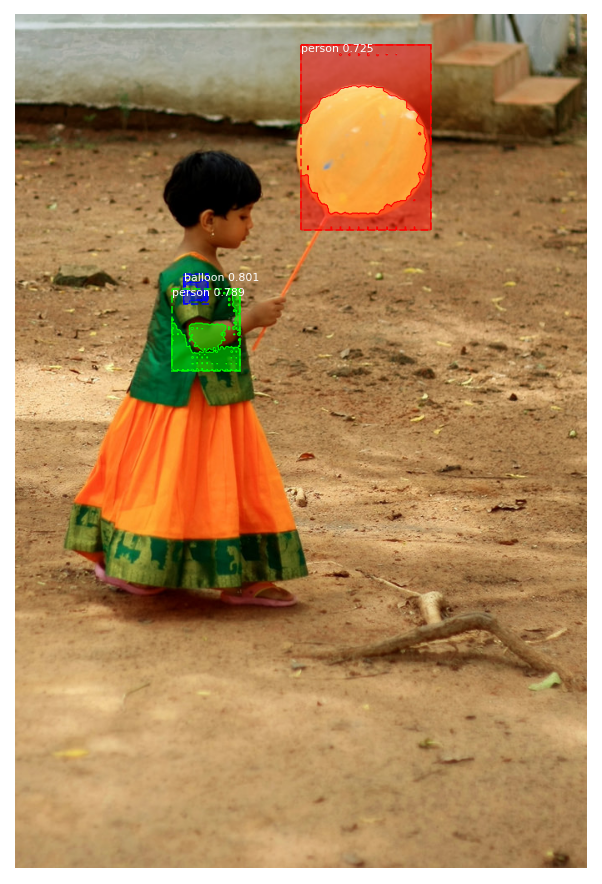

Processing 1 images
image                    shape: (1024, 683, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 11)               min:    0.00000  max: 1024.00000


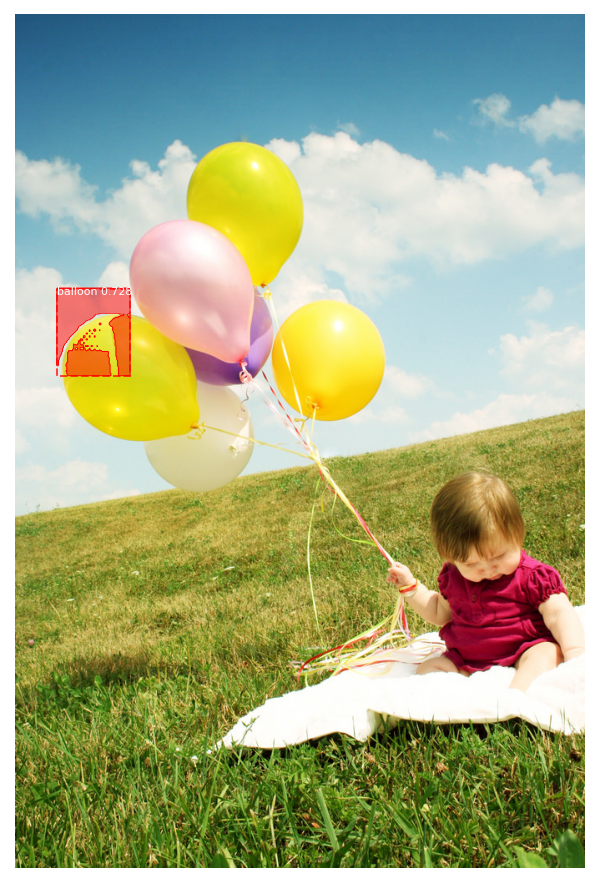

Processing 1 images
image                    shape: (768, 1024, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 11)               min:    0.00000  max: 1024.00000


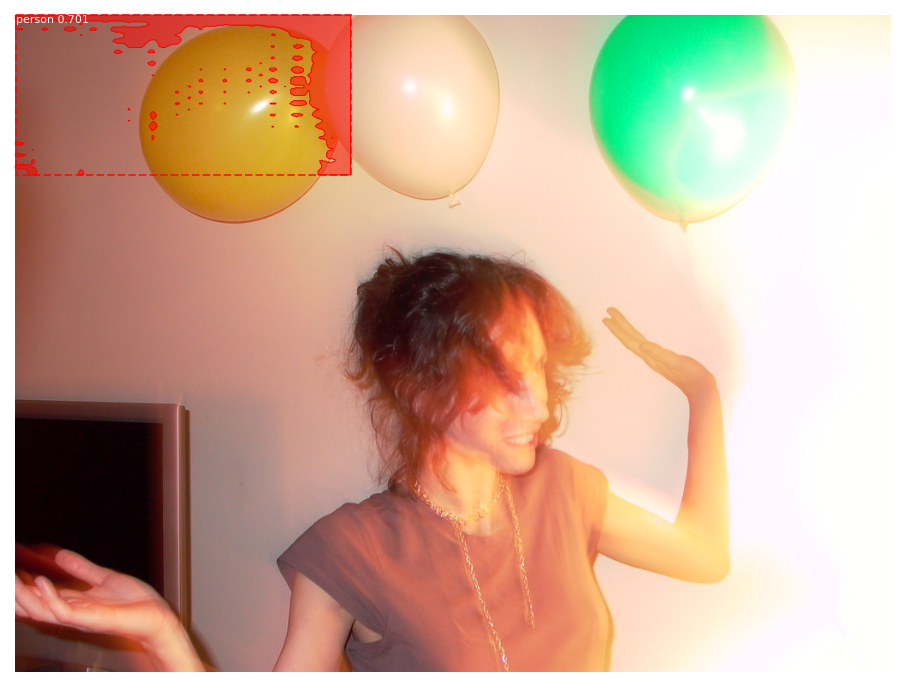

Processing 1 images
image                    shape: (1024, 776, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 11)               min:    0.00000  max: 1024.00000

*** No instances to display *** 



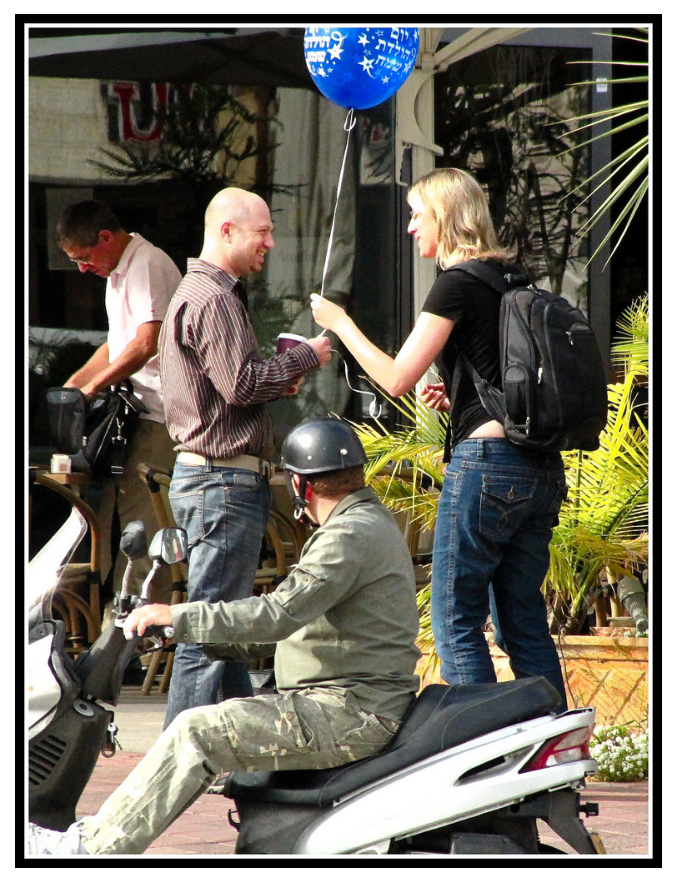

Processing 1 images
image                    shape: (675, 1024, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 11)               min:    0.00000  max: 1024.00000


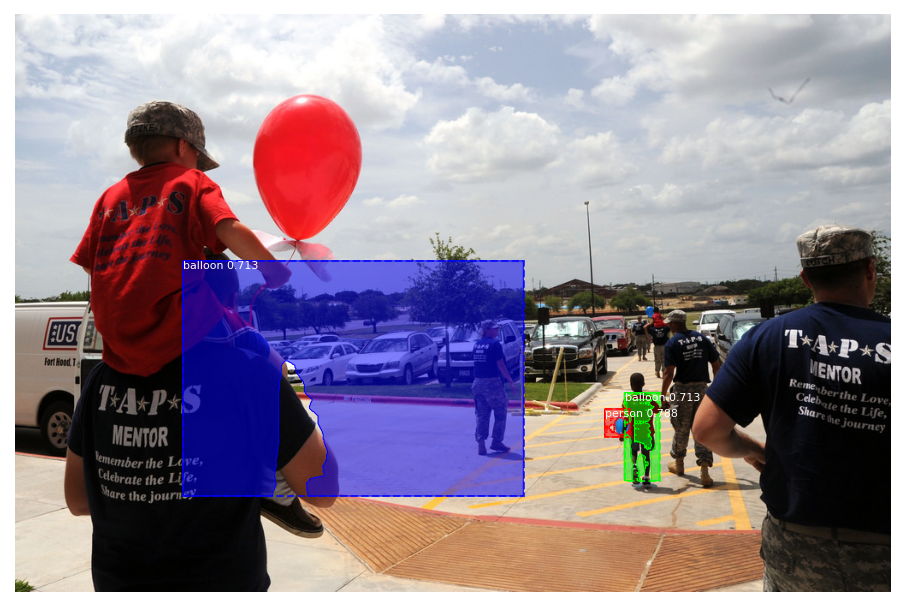

Processing 1 images
image                    shape: (1024, 683, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 11)               min:    0.00000  max: 1024.00000


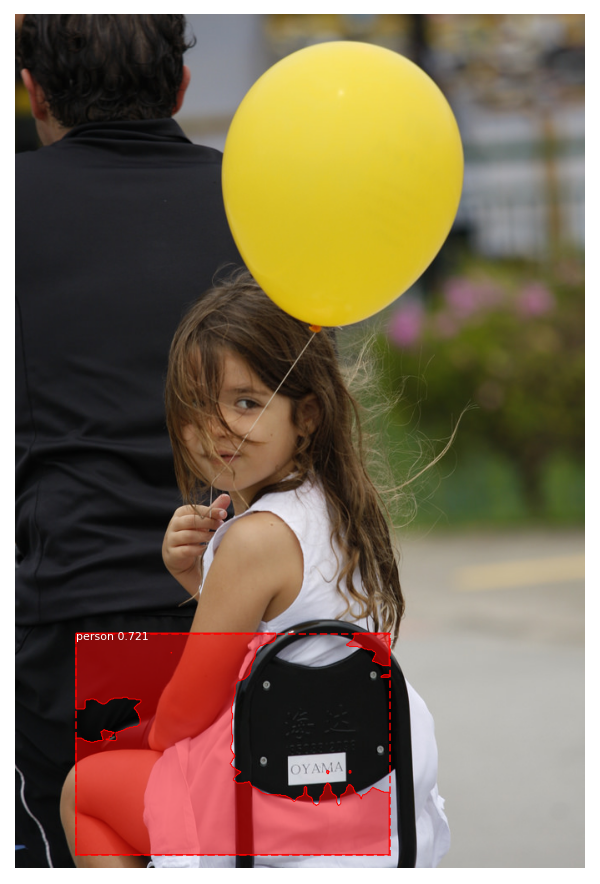

Processing 1 images
image                    shape: (1024, 768, 3)        min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 11)               min:    0.00000  max: 1024.00000


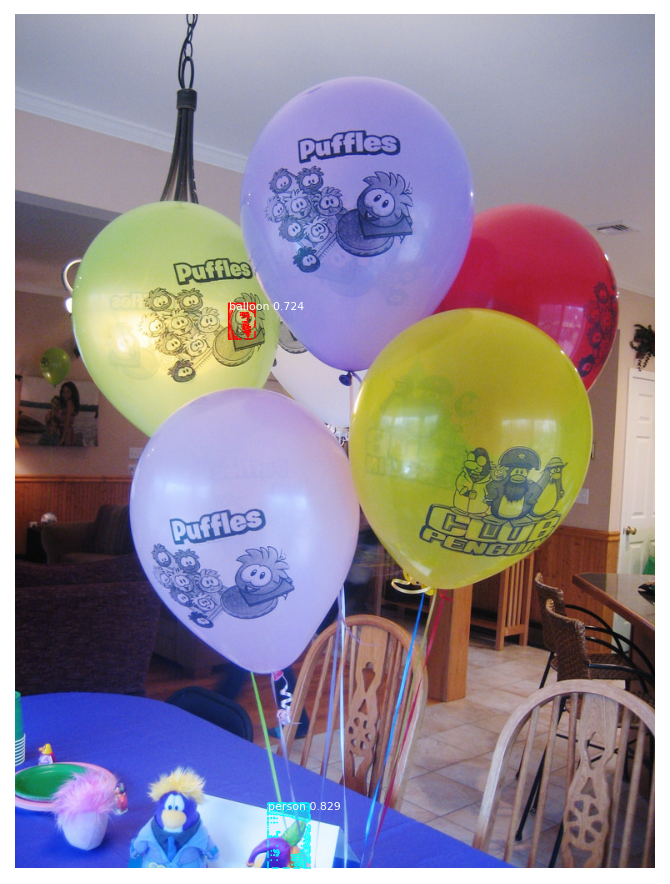

Processing 1 images
image                    shape: (1536, 2048, 3)       min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  138.20000
image_metas              shape: (1, 11)               min:    0.00000  max: 2048.00000


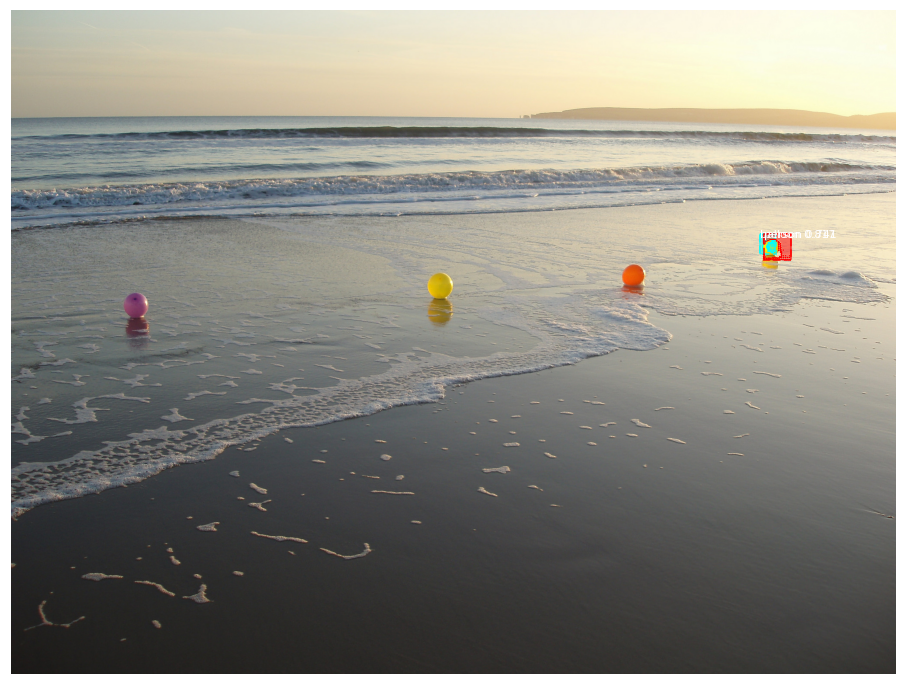

Processing 1 images
image                    shape: (1595, 2048, 3)       min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 11)               min:    0.00000  max: 2048.00000


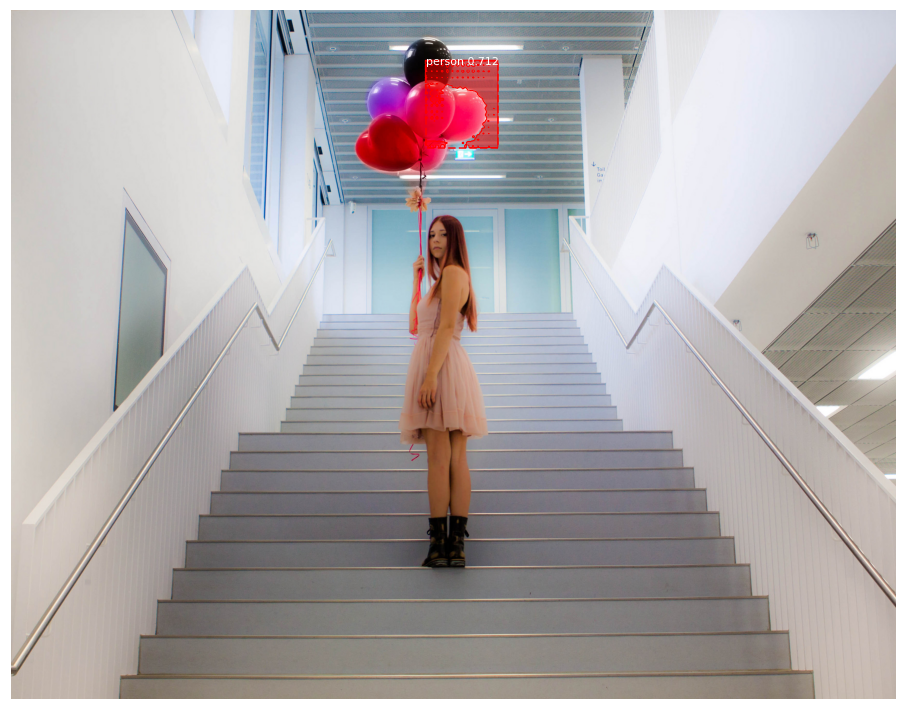

UnidentifiedImageError: cannot identify image file 'C:\\Users\\Amber\\Desktop\\Mask_RCNN_balloon\\val\\via_region_data.json'

In [11]:
# Load a random image from the images folder,多加了 plugin='matplotlib',資料夾只能有圖片檔案.jpg
file_names = next(os.walk(IMAGE_DIR))[2]
print(file_names)

for x in range(len(file_names)):
    image = io.imread(os.path.join(IMAGE_DIR, file_names[x]) ,plugin='matplotlib')

#image = io.imread(os.path.join(IMAGE_DIR, random.choice(file_names)))    
    
# Run detection
    results = model.detect([image], verbose=1)

# Visualize results
    r = results[0]
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'],
                            class_names, r['scores'])


In [ ]:
# Load a random image from the images folder,多加了 plugin='matplotlib'
file_names = next(os.walk(IMAGE_DIR))[2]
print(file_names)

image = io.imread(os.path.join(IMAGE_DIR, random.choice(file_names)))    
    
# Run detection
results = model.detect([image], verbose=1)

# Visualize results
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'],
                            class_names, r['scores'])